# Introduction

## Objectives

## Imports

In [2]:
# Basics
import numpy as np
import pandas as pd
import logging
import itertools

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Machine learning models
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier

# Machine Learning tools
from sklearn.model_selection import train_test_split
from sklearn.tree import plot_tree

# Extras
from pdpbox import pdp
from alepython import ale_plot
from sklearn.inspection import permutation_importance
import eli5
import shap
from lime.lime_tabular import LimeTabularExplainer
from anchor.anchor_tabular import AnchorTabularExplainer
import alibi

## Logging

We are going to define here logging utilities, this is useful for debuggin and for controlling how our code is working through executions:
* **Logging file**: save important logs in logging.log file, this is useful for getting info about what our code is doing.
* **Logging stream**: print logs in real time, this is useful for tracking times and debugging our code. *Change DEBUG to INFO to decrease verbosity*.

In [3]:
# Create the logger
logger = logging.getLogger(__name__)
logger.setLevel(logging.DEBUG)

# Set the format
formatter_file = logging.Formatter('%(asctime)s %(name)s %(lineno)d:%(levelname)s %(message)s')
formatter_stream = logging.Formatter('%(asctime)s : %(levelname)s %(message)s')

# Create a handler for saving the logs
file_handler = logging.FileHandler('logging.log', mode = 'w')
file_handler.setLevel(logging.INFO)
file_handler.setFormatter(formatter_file)

# Create a handler for showing the logs
stream_handler = logging.StreamHandler()
stream_handler.setLevel(logging.DEBUG)
stream_handler.setFormatter(formatter_stream)

# Add the handlers to the logger
logger.addHandler(file_handler)
logger.addHandler(stream_handler)

## Environment variables

## Generic functions

In [4]:
def plot_distributions(data, dict_labels = None, n_cols = 5, show = True):
    '''
    Plot the distribution of features in a dataset.
    
    Args:
        data: pd.DataFrame, dataframe containting the data
        n_cols: integer, number of cols of the plot
    
    Return:
        fig: plt.figure, figure object containing the plots
    '''
    # Define the layout of the plot
    n_rows = len(data.columns.tolist()) // n_cols + 1

    # Instantiate the figure
    fig = plt.figure(figsize = (20, 5*n_rows))

    # Recursively add a subplot for each variable
    for i,var in enumerate(data.columns):

        # Add the subplot
        ax = fig.add_subplot(n_rows, n_cols, i + 1)
        
        # Plot feature distribution if numeric
        if data[var].dtype in ['int64','float64']:
            sns.distplot(data[var], bins = 20, kde = False)
            
        # Plot feature counts if categorical
        else:
            sns.countplot(data[var])
            plt.xticks(rotation = 90)

        # Formatting
        ax.set_title(var + ' distribution')
        ax.set_xlabel(var)
        ax.set_ylabel('Frecuency')

    # Formatting    
    fig.tight_layout()

    # Show if necessary
    if show:
        plt.show()

    return fig

In [5]:
def plot_vars_vs_target(data, var_target = 'Target', n_cols = 5):
    '''
    Plot the scatterplot of features vs. target in a dataset.
    
    Args:
        data: pd.DataFrame, dataframe containting the data
        var_target: string, name of the target variable
        n_cols: integer, number of cols of the plot
    '''
    # Define the layout of the plot
    n_rows = len(data.columns.tolist()) // n_cols + 1

    plt.figure(figsize = (20, 5*n_rows))
    for i,var in enumerate(data.columns[:-1]):
        plt.subplot(n_rows, n_cols, i + 1)
        
        # Plot feature distribution if numeric
        if data[var].dtype in ['int64','float64']:
            sns.scatterplot(x = var, y = var_target, data = data, alpha = 0.3)
            plt.title('{} vs. {}'.format(var_target, var))
            plt.xlabel(var)
            plt.ylabel(var_target)
            
        # Plot feature distribution if cateogorical
        elif data[var].dtype == 'category':
            sns.violinplot(x = var, y = var_target, data = data)
            plt.title('{} vs. {}'.format(var_target, var))
            plt.xlabel(var)
            plt.ylabel(var_target)
            plt.xticks(rotation = 90)
            
        # Skip feature otherwise
        else:
            pass
        
    plt.tight_layout()

## References

https://github.com/SauceCat/PDPbox (in sandbox)  
https://github.com/AustinRochford/PyCEbox  
https://github.com/blent-ai/ALEPython  
https://github.com/TeamHG-Memex/eli5  
https://github.com/slundberg/shap (in sandbox)   
https://github.com/marcotcr/lime (in sandbox)  
https://github.com/marcotcr/lime-experiments  
https://github.com/marcotcr/anchor  
https://github.com/marcotcr/anchor-experiments  
https://github.com/SeldonIO/alibi  

# Data

We are going to use **Adult Dataset** to ilustrate the different methods we have studied. This dataset contains socioeconomic information about some people in U.S., and the prediction task is to determine whether a person makes over $50K a year. We use this dataset because it contains both numerical and categorical features, so we can consider all prosible cases of features.

As we said, we are using the Adult Dataset (https://archive.ics.uci.edu/ml/datasets/adult),  which has the following features:
* **Age**: the age of an individual
* **Education**: the highest level of education achieved by an individual (this value is a proxi for EducationYears, so we will not use it)
    * Preschool
    * 1st-4th
    * 5th-6th
    * 7th-8th
    * 9th
    * 10th
    * 11th
    * 12th
    * Bachelors
    * Masters
    * Doctorate
    * Some-college
    * HS-grad
    * Prof-school
    * Assoc-acdm
    * Assoc-voc
* **EducationYears**: number of years in education (contiuous version of Education)
* **Relationship**: represents what this individual is relative to others. Each entry only has one relationship attribute and is somewhat redundant with marital status. (we will not use it)
    * Wife
    * Own-child
    * Husband
    * Not-in-family
    * Other-relative
    * Unmarried.
* **MaritalStatus**: marital status of an individual, civ corresponds to a civilian spouse while AF is a spouse in the Armed Forces.
    * Never-married
    * Married-civ-spouse
    * Married-spouse-absent
    * Married-AF-spouse
    * Divorced
    * Separated
    * Widowed
* **WorkingClass**: a general term to represent the employment status of an individual
    * Private
    * Self-emp-not-inc
    * Self-emp-inc
    * Federal-gov
    * Local-gov
    * State-gov
    * Without-pay
    * Never-worked
* **Occupation**: the general type of occupation of an individual
    * Tech-support
    * Craft-repair
    * Other-service
    * Sales
    * Exec-managerial,
    * Prof-specialty
    * Handlers-cleaners
    * Machine-op-inspct
    * Adm-clerical
    * Farming-fishing
    * Transport-moving
    * Priv-house-serv
    * Protective-serv
    * Armed-Forces
* **Race**: 
    * White
    * Asian-Pac-Islander
    * Amer-Indian-Eskimo
    * Other
    * Black.
* **Sex**: 
    * Female
    * Male.
* **fnlwgt**: final weight, the number of people the census believes the entry represents.
* **CapitalGain**: continuous.
* **CapitalLoss**: continuous.
* **HoursPerWeek**: the hours an individual has reported to work per week
* **NativeCountry**: (too many classes, we will not use it)
    * United-States 
    * Cambodia 
    * England 
    * Puerto-Rico 
    * Canada 
    * Germany 
    * Outlying-US(Guam-USVI-etc) 
    * India 
    * Japan 
    * Greece 
    * South 
    * China 
    * Cuba 
    * Iran 
    * Honduras 
    * Philippines 
    * Italy 
    * Poland 
    * Jamaica 
    * Vietnam 
    * Mexico 
    * Portugal 
    * Ireland 
    * France 
    * Dominican-Republic 
    * Laos 
    * Ecuador 
    * Taiwan 
    * Haiti 
    * Columbia 
    * Hungary 
    * Guatemala 
    * Nicaragua 
    * Scotland 
    * Thailand 
    * Yugoslavia 
    * El-Salvador 
    * Trinadad&Tobago 
    * Peru 
    * Hong 
    * Holand-Netherlands.
* **Income**: target variable, annual income
    * \>   50K
    * <= 50K

We start by importing the data, and doing some preprocessing

In [6]:
# Import data
logger.info('Import data')
df_classification = pd.read_csv('data/adult.csv')

# Rename columns
df_classification.columns = ['Age',
                             'WorkingClass',
                             'FinalWeight',
                             'Education', 
                             'EducationYears',
                             'MaritalStatus', 
                             'Occupation', 
                             'Relationship',
                             'Race',
                             'Sex',
                             'CapitalGain',
                             'CapitalLoss',
                             'HoursPerWeek',
                             'NativeCountry',
                             'Target'
                             ]

# Clean the data
df_classification['Target'] = df_classification['Target'].map({'<=50K' : 0, '>50K' : 1})

# Correct the types
df_classification = df_classification.astype({'WorkingClass'  : 'category',
                                              'Education'     : 'category',
                                              'MaritalStatus' : 'category',
                                              'Occupation'    : 'category', 
                                              'Relationship'  : 'category',
                                              'Race'          : 'category',
                                              'Sex'           : 'category',
                                              'NativeCountry' : 'category',
                                              'EducationYears': 'float',
                                              'Target'        : 'int'
                                              })

# Drop some columns
df_classification = df_classification.drop('Education', axis = 1)
df_classification = df_classification.drop('FinalWeight', axis = 1)
df_classification = df_classification.drop('CapitalGain', axis = 1)
df_classification = df_classification.drop('CapitalLoss', axis = 1)
df_classification = df_classification.drop('Relationship', axis = 1)
df_classification = df_classification.drop('NativeCountry', axis = 1)
df_classification = df_classification.drop('WorkingClass', axis = 1)

2020-06-16 14:53:57,550 : INFO Import data


then take a look at the variables

In [7]:
df_classification.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   Age             48842 non-null  int64   
 1   EducationYears  48842 non-null  float64 
 2   MaritalStatus   48842 non-null  category
 3   Occupation      48842 non-null  category
 4   Race            48842 non-null  category
 5   Sex             48842 non-null  category
 6   HoursPerWeek    48842 non-null  int64   
 7   Target          48842 non-null  int64   
dtypes: category(4), float64(1), int64(3)
memory usage: 1.7 MB


and to some samples of data

In [8]:
df_classification.head()

,Age,EducationYears,MaritalStatus,Occupation,Race,Sex,HoursPerWeek,Target
0,25,7.0,Never-married,Machine-op-inspct,Black,Male,40,0
1,38,9.0,Married-civ-spouse,Farming-fishing,White,Male,50,0
2,28,12.0,Married-civ-spouse,Protective-serv,White,Male,40,1
3,44,10.0,Married-civ-spouse,Machine-op-inspct,Black,Male,40,1
4,18,10.0,Never-married,?,White,Female,30,0


so we can plot a distribution of the variables

2020-06-16 14:53:59,197 : INFO Plot data distributions


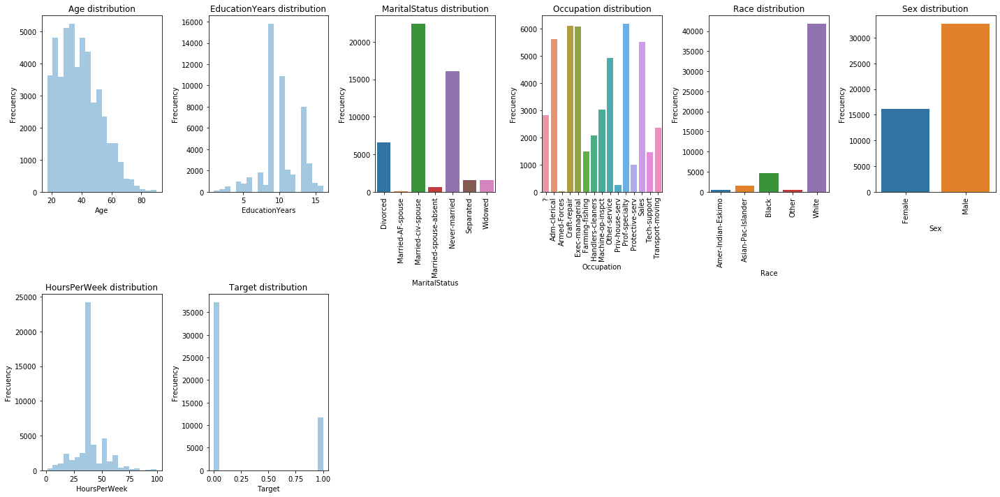

In [9]:
logger.info('Plot data distributions')
plot_distributions(df_classification, n_cols = 6)
plt.show()

and a naive plot of direct dependences

2020-06-16 14:54:01,650 : INFO Plot data targetplots


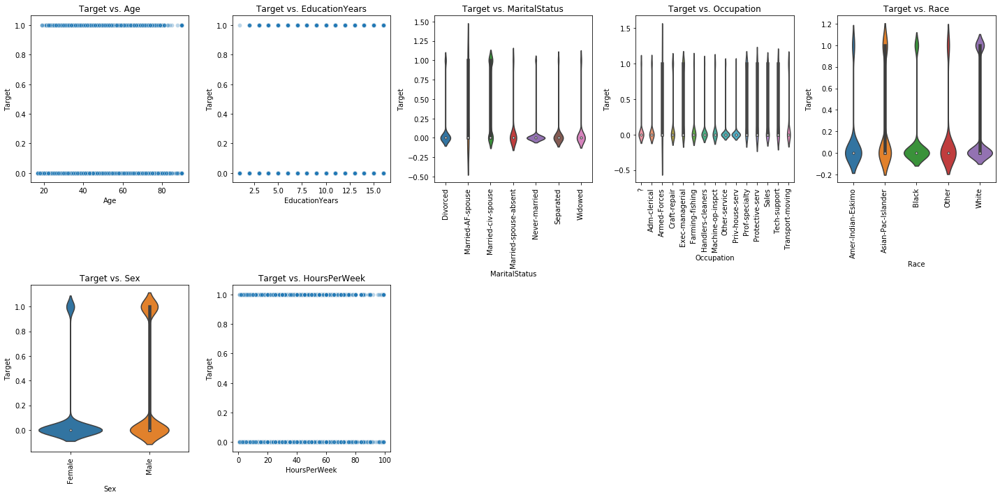

In [10]:
logger.info('Plot data targetplots')
plot_vars_vs_target(df_classification)
plt.show()

# Interpretable models

In [11]:
# Prepare the data for the model
X = df_classification.drop('Target', axis = 1).copy()
y = df_classification['Target'].copy()
    
# Save the original features
features = X.columns.tolist()
categorical_features = [var for var in features if X[var].dtype not in ['int64','float64']]   

# Get dummies for categorical variables
for var in categorical_features:
    X_var = pd.get_dummies(X[var], prefix = var, prefix_sep = '_')
    X = X.drop(var, axis = 1)
    X = pd.concat([X, X_var], axis = 1)

# Create a train set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, random_state=0)

## Linear models

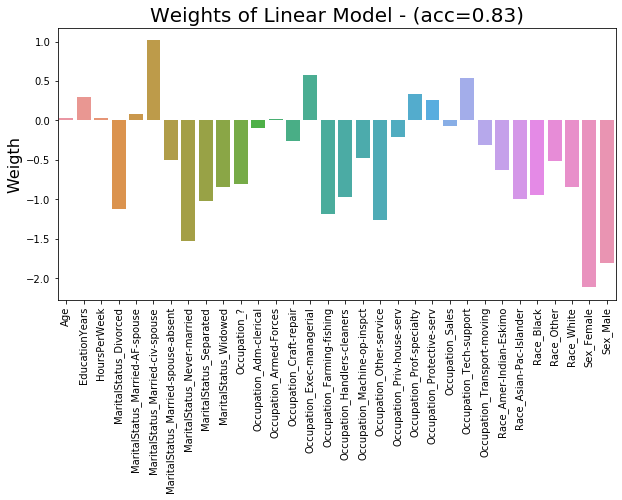

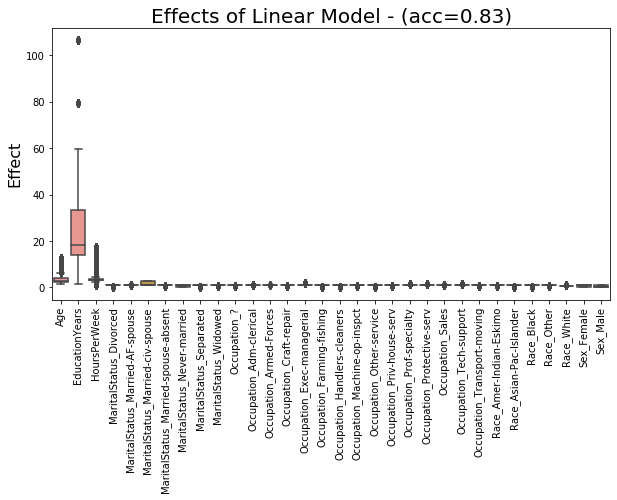

In [12]:
# Initiate and train the model
lr = LogisticRegression()
lr.fit(X_train, y_train)

# Compute weights
df_weights = pd.DataFrame({'Feature' : X.columns, 'Weight' : lr.coef_[0]})

# Compute effects
df_effects = np.exp(np.multiply(X, df_weights.iloc[:,1]))

# Plot weights
plt.figure(figsize = (10, 5))
sns.barplot(x = 'Feature', y = 'Weight', data = df_weights)
plt.title('Weights of Linear Model - (acc={:.2f})'.format(lr.score(X_test, y_test)), fontsize = 20)
plt.xlabel('')
plt.ylabel('Weigth', fontsize = 16)
plt.xticks(rotation = 90)
plt.show()

# Plot effects
plt.figure(figsize = (10, 5))
sns.boxplot(data = df_effects)
plt.title('Effects of Linear Model - (acc={:.2f})'.format(lr.score(X_test, y_test)), fontsize = 20)
plt.xlabel('', fontsize = 16)
plt.ylabel('Effect', fontsize = 16)
plt.xticks(rotation = 90)
plt.show()

## Tree models

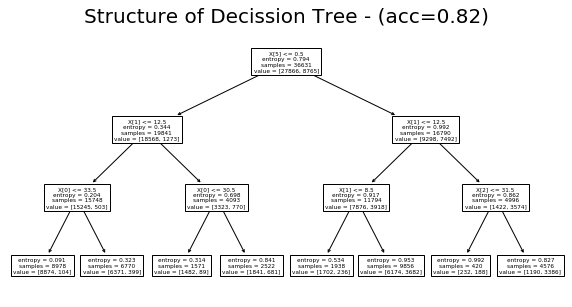

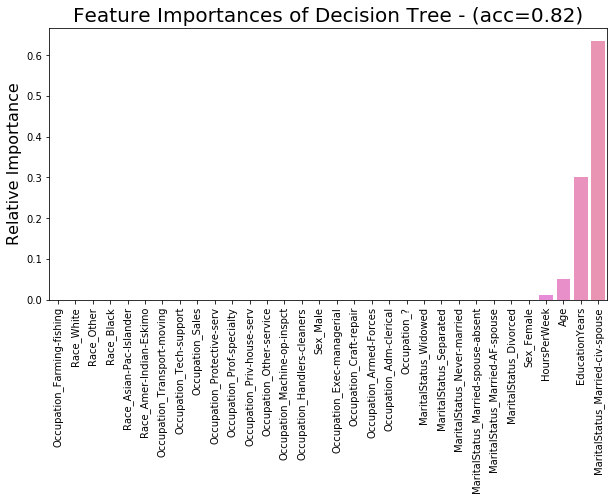

In [13]:
# Initiate and train the model
dtr = DecisionTreeClassifier(max_depth = 3, criterion='entropy')
dtr.fit(X_train, y_train)

# Compute importances
df_importances = pd.DataFrame({'Feature' : X.columns, 'Importance' : dtr.feature_importances_})
df_importances = df_importances.sort_values(by = 'Importance')

# Plot structure
plt.figure(figsize = (10, 5))
plot_tree(dtr)
plt.title('Structure of Decission Tree - (acc={:.2f})'.format(dtr.score(X_test, y_test)), fontsize = 20)
plt.show()

# Plot importances
plt.figure(figsize = (10, 5))
sns.barplot(x = 'Feature', y = 'Importance', data = df_importances)
plt.title('Feature Importances of Decision Tree - (acc={:.2f})'.format(dtr.score(X_test, y_test)), fontsize = 20)
plt.xlabel('', fontsize = 16)
plt.ylabel('Relative Importance', fontsize = 16)
plt.xticks(rotation = 90)
plt.show()

# Non-interpretable models

## Ranfom Forest

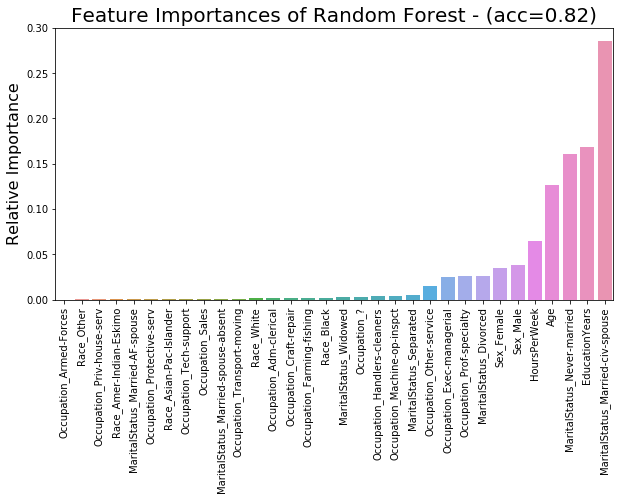

In [14]:
# Initiate and train the model
rfc = RandomForestClassifier(n_estimators = 100, max_depth = 5, criterion = 'entropy')
rfc.fit(X_train, y_train)

# Compute importances
df_importances = pd.DataFrame({'Feature' : X.columns, 'Importance' : rfc.feature_importances_})
df_importances = df_importances.sort_values(by = 'Importance')

# Plot importances
plt.figure(figsize = (10, 5))
sns.barplot(x = 'Feature', y = 'Importance', data = df_importances)
plt.title('Feature Importances of Random Forest - (acc={:.2f})'.format(rfc.score(X_test, y_test)), fontsize = 20)
plt.xlabel('', fontsize = 16)
plt.ylabel('Relative Importance', fontsize = 16)
plt.xticks(rotation = 90)
plt.show()

# Model-Agnostic Methods

## Partial Dependence Plots (PDP)

As we have studied, viewing plots (PDP) of the partial dependence approximations fo the model on selected variables can help to provide a qualitative description of its properties. The algorithm to perfom these plots is the following:  
* Discretize $X_S$ for a smooth interpretation. 
* Compute the predictions of the model $f(x_S,x_C)$ por all $x_S \in X_S, x_C \in X_C$.   
* For a given $x_S \in X_S$ average the predictions over all $x_C \in X_C$.  
* Plot the averaged values vs $X_S$.

### From scratch

In [18]:
def partial_dependence_plot(data, model, var_s, var_target = 'Target', dict_labels = None, n_grid = 10):
    '''
    Compute the partial dependence plot (PDP) of the output of a model with respect to one variable. 
    This computation is made by averaging the target variables over some selected variables, that is, 
    we select the features to keep and use as explanations, make predictions using these points, 
    and average the predictions over the unique values of the selected features.
    
    Args:
        data: pd.DataFrame, dataframe containing the training data of the model
        model: sklearn model instance, model trained with data in data
        var_s: string, name of the variable to compute the partial dependence of
        var_target: string, name of the target variable
        dict_labels: dictionary, dictionary of dictionaries with the labels of the categories for each
        categorical variable
        n_grid: integer, number of points in the PDP
    '''
    logger.info('Compute PDP for {}'.format(var_s))
    
    # Get features
    df = data.copy()
    features_with_dummies = df.columns.tolist()
    
    # Check if var_s is numeric or categorical by looking at the possible dummy variables
    numeric = True
    if var_s not in features_with_dummies:
        var_s_categories = [var for var in features_with_dummies if var_s in var]
        if len(var_s_categories) > 0:
            numeric = False
        else:
            print('This variable is not available.')
            pass
            
    # Make the grid
    logger.debug('* Making the grid')
    if numeric:
        # Discretize the variable in quantiles
        df[var_s] = [(x.left + x.right) / 2 for x in pd.qcut(df[var_s], n_grid)]

        # Get the unique values
        x_s = pd.DataFrame({var_s : df[var_s].unique(), 'key' : 0})

        # Remove the original values
        df = df.drop(var_s, axis = 1)
    else:
        # If the variable is categorical we need to get dummy version of all possible cases
        x_s = pd.DataFrame(np.identity(n = len(var_s_categories)), columns = var_s_categories)
        x_s['key'] = 0
        
        # Remove the original values
        df = df.drop(var_s_categories, axis = 1)
    
    # Make a cartesian product
    df['key'] = 0
    df = x_s.merge(df, on = 'key', how = 'left')
    df = df.drop('key', axis = 1)
    df = df[data.columns.tolist()]
        
    # Index each x_S
    df['Index'] = np.repeat(range(x_s.shape[0]), data.shape[0])
    
    # Make predictions
    logger.debug('* Making predictions')
    df['pred'] = model.predict(df.drop('Index', axis = 1).values)
    y_min = df['pred'].min()
    y_max = df['pred'].max()

    if not numeric:
        # Combine the dummy variables and recover the original categories for visualization purposes
        df_var_s = df[var_s_categories].idxmax(axis = 1)
        df_var_s = df_var_s.apply(lambda x: x.replace(var_s + '_', ''))           
        df = df.drop(var_s_categories, axis = 1)
        df[var_s] = df_var_s
    
    # Compute partial dependences
    logger.debug('* Computing partial dependences')
    df_pdp = df.groupby(var_s, as_index = False)['pred'].mean()
        
    # Make the plot
    logger.debug('* Making the plot')
    if numeric:
        sns.lineplot(x = var_s, 
                     y = 'pred', 
                     data = df_pdp
                     )
        sns.rugplot(a = data[var_s], 
                    height = 0.05, 
                    axis = 'x', 
                    alpha = 0.1
                    )
    else:
        sns.barplot(x = var_s, 
                    y = 'pred', 
                    data = df_pdp
                    )
        sns.pointplot(x = var_s, 
                      y = 'pred', 
                      data = df_pdp, 
                      color = 'black'
                      )
        plt.xticks(rotation = 45)
    
    # Formatting
    plt.title('PDP for {}'.format(var_s), fontsize = 20)
    plt.xlabel(var_s, fontsize = 16)
    plt.ylabel(var_target, fontsize = 16)
    plt.ylim(y_min, y_max)
        
    logger.debug('* Done')

2020-06-10 21:49:30,692 : INFO Compute PDP for EducationYears
2020-06-10 21:49:30,695 : DEBUG * Making the grid
2020-06-10 21:49:30,941 : DEBUG * Making predictions
2020-06-10 21:49:32,432 : DEBUG * Computing partial dependences
2020-06-10 21:49:32,456 : DEBUG * Making the plot
2020-06-10 21:49:32,956 : DEBUG * Done
2020-06-10 21:49:32,976 : INFO Compute PDP for MaritalStatus
2020-06-10 21:49:32,979 : DEBUG * Making the grid
2020-06-10 21:49:33,102 : DEBUG * Making predictions
2020-06-10 21:49:36,288 : DEBUG * Computing partial dependences
2020-06-10 21:49:36,326 : DEBUG * Making the plot
2020-06-10 21:49:36,429 : DEBUG * Done


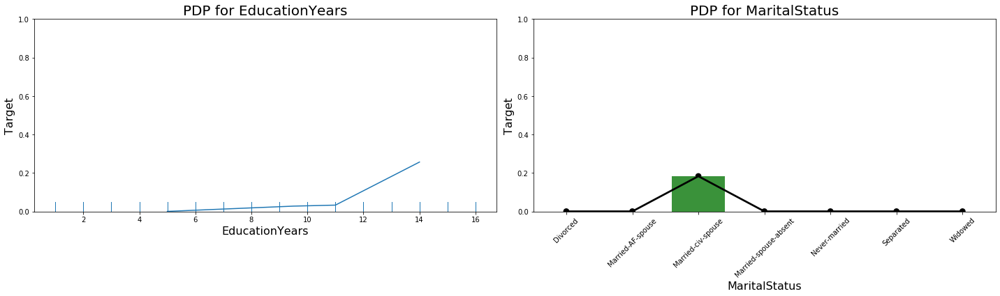

In [19]:
# Obtain the PDPs for variables
features = ['EducationYears', 'MaritalStatus']

# Define the layout of the plot
n_cols = 2
n_rows = len(features) // n_cols + 1

# Obtain PDP for each variable
plt.figure(figsize = (20, 5*n_rows))
for i,var in enumerate(features):
    plt.subplot(n_rows, n_cols, i + 1)
    partial_dependence_plot(data = X_train, 
                            model = rfc, 
                            var_s = var, 
                            var_target = 'Target', 
                            n_grid = 4
                            )
    
plt.tight_layout()
plt.show()

### Extra: pdpbox library

After developing some intuition on PDP building them from scratch, we can explore more advanced implementations of this method. A popular library for this purpose is [PDPbox](https://github.com/SauceCat/PDPbox), it provides more curated visualizations for PDPs and ICEs. We can reproduce some of our examples in its absolute, relative and multifeature form.

2020-06-10 21:05:34,300 : INFO Compute PDP with PDPbox


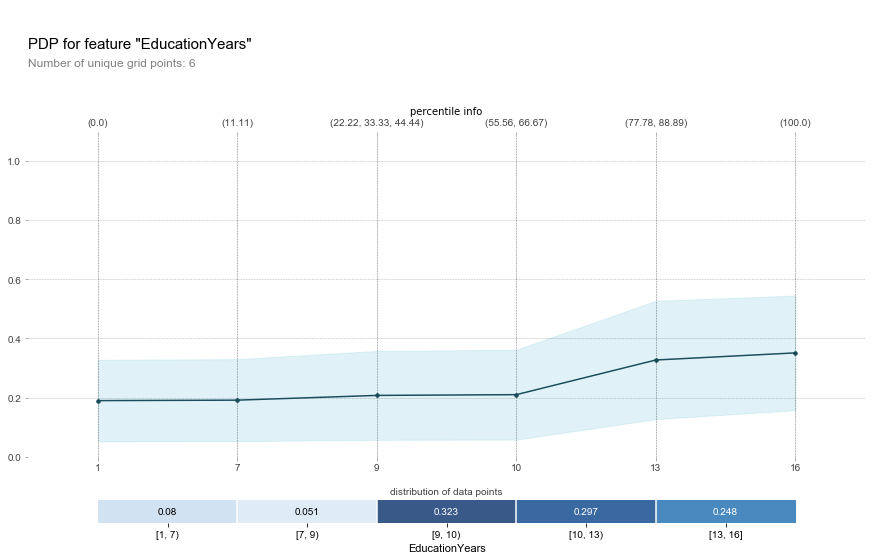

2020-06-10 21:05:38,976 : INFO Compute PDP with PDPbox


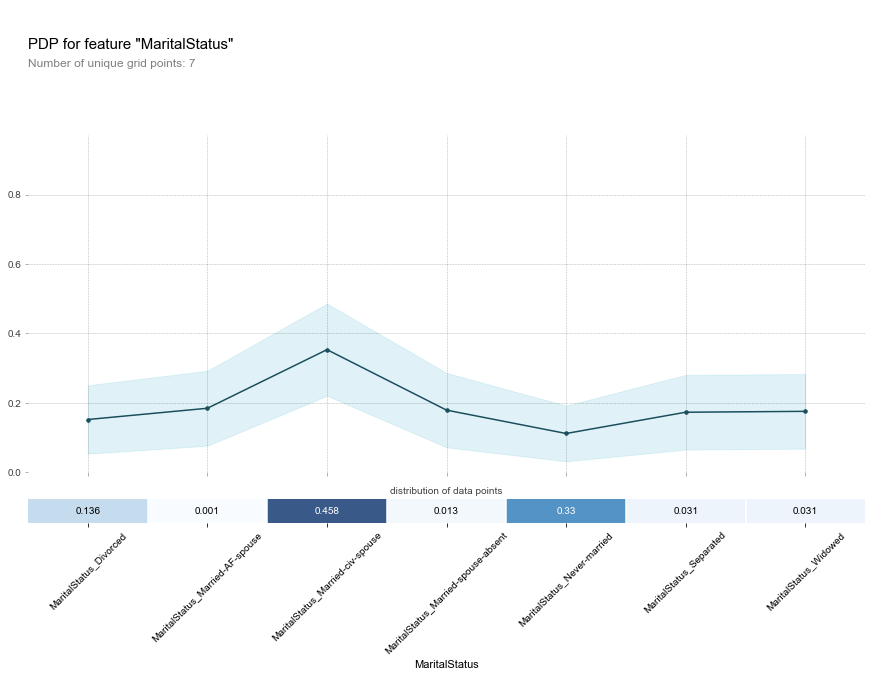

In [17]:
# Numerical variable
logger.info('Compute PDP with PDPbox')
pdp_EducationYears = pdp.pdp_isolate(model = rfc,
                                     dataset = X_train,
                                     model_features = X_train.columns.tolist(),
                                     feature = 'EducationYears'
                                     )
fig, axes = pdp.pdp_plot(pdp_isolate_out = pdp_EducationYears, 
                         feature_name = 'EducationYears', 
                         plot_lines = False, 
                         x_quantile = True, 
                         plot_pts_dist = True, 
                         show_percentile = True, 
                         center = False, 
                         )
plt.show()

# Categorical variable
logger.info('Compute PDP with PDPbox')
pdp_MaritalStatus = pdp.pdp_isolate(model = rfc, 
                             dataset = X_train, 
                             model_features = X_train.columns.tolist(), 
                             feature = [var for var in X_train.columns.tolist() if 'MaritalStatus' in var]
                             )
fig, axes = pdp.pdp_plot(pdp_isolate_out = pdp_MaritalStatus, 
                         feature_name = 'MaritalStatus', 
                         plot_lines = False,
                         plot_pts_dist = True, 
                         center = False
                         )
plt.xticks(rotation=45)
plt.show()

2020-06-10 21:05:43,066 : INFO Compute PDP with PDPbox


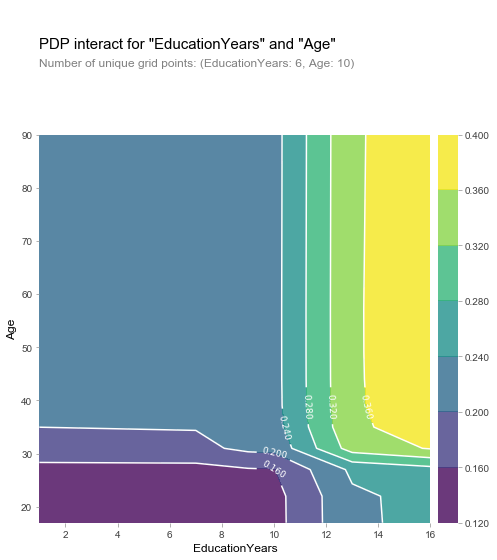

2020-06-10 21:06:17,579 : INFO Compute PDP with PDPbox


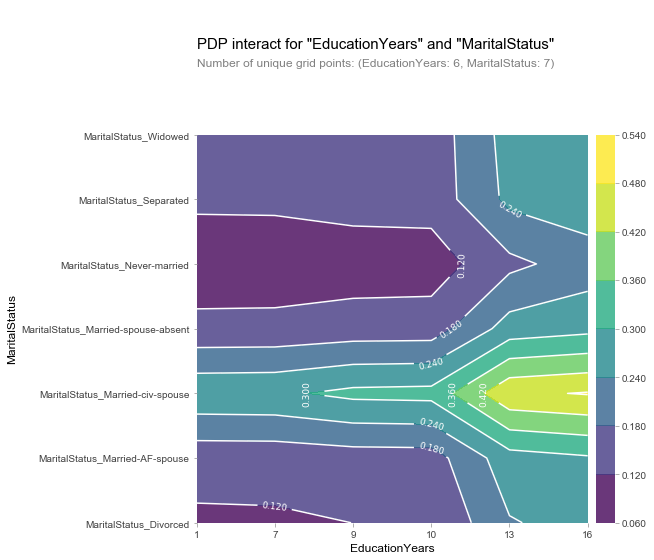

In [18]:
# Numerical variable
logger.info('Compute PDP with PDPbox')
pdp_interaction = pdp.pdp_interact(model = rfc,
                                   dataset = X_train,
                                   model_features = X_train.columns.tolist(),
                                   features = ['EducationYears','Age']
                                   )
fig, axes = pdp.pdp_interact_plot(pdp_interact_out = pdp_interaction,
                                  feature_names = ['EducationYears','Age'],
                                  x_quantile = False,
                                  plot_pdp = False,
                                  plot_type = 'contour'
                                  )
plt.show()

# Categorical variable
logger.info('Compute PDP with PDPbox')
pdp_interaction = pdp.pdp_interact(model = rfc,
                                   dataset = X_train,
                                   model_features = X_train.columns.tolist(),
                                   features = ['EducationYears',[var for var in X_train.columns.tolist() if 'MaritalStatus' in var]]
                                   )
fig, axes = pdp.pdp_interact_plot(pdp_interact_out = pdp_interaction,
                                  feature_names = ['EducationYears','MaritalStatus'],
                                  x_quantile = True,
                                  plot_pdp = False,
                                  plot_type = 'contour'
                                  )
plt.show()

## Independent Conditional Explanation (ICE)

As we have just seen, PDPs show the mean effect of a variable in the predicitions of the model, but we can also look at how individual predictions are affected by the change of this variable. This is knonw as Individual Conditional Explanations. The idea of its calculation is very similar to PDPs:
* Discretize $X_S$ for a smooth interpretation. 
* Compute the predictions of the model $f(x_S,x_C)$ por all $x_S \in X_S, x_C \in X_C$.   
* For each given $x_C \in X_C$ plot the predicictions vs $X_S$.

### From scracth

In [19]:
def independent_conditional_explanation(data, model, var_s, var_target = 'Target', dict_labels = None, n_grid = 10, frac_to_plot = 1.0, centered = False):
    '''
    Compute the independent conditional explanation (ICE) of the output of a model with respect to one 
    variable. This computation is made by averaging the target variables over some selected variables, that is, 
    we select the features to keep and use as explanations, make predictions using these points, 
    and average the predictions over the unique values of the selected features.
    
    Args:
        data: pd.DataFrame, dataframe containing the training data of the model
        model: sklearn model instance, model trained with data in data
        var_s: string, name of the variable to compute the partial dependence of
        var_target: string, name of the target variable
        dict_labels: dictionary, dictionary of dictionaries with the labels of the categories for each
        categorical variable
        n_grid: integer, number of points in the ICE
        frac_to_plot: float, frac of the samples to plot the ICE for
    '''
    logger.info('Compute ICE for {}'.format(var_s))
    
    # Get features
    df = data.copy()
    features_with_dummies = df.columns.tolist()
    
    # Check if var_s is numeric or categorical by looking at the possible dummy variables
    numeric = True
    if var_s not in features_with_dummies:
        var_s_categories = [var for var in features_with_dummies if var_s in var]
        if len(var_s_categories) > 0:
            numeric = False
        else:
            print('This variable is not available.')
            pass
            
    # Make the grid
    logger.debug('* Making the grid')
    if numeric:
        # Discretize the variable in quantiles
        df[var_s] = [(x.left + x.right) / 2 for x in pd.qcut(df[var_s], n_grid)]

        # Get the unique values
        x_s = pd.DataFrame({var_s : df[var_s].unique(), 'key' : 0})

        # Remove the original values
        df = df.drop(var_s, axis = 1)
    else:
        # If the variable is categorical we need to get dummy version of all possible cases
        x_s = pd.DataFrame(np.identity(n = len(var_s_categories)), columns = var_s_categories)
        x_s['key'] = 0
        
        # Remove the original values
        df = df.drop(var_s_categories, axis = 1)
    
    # Make a cartesian product
    df['key'] = 0
    df = df.merge(x_s, on = 'key', how = 'left')
    df = df.drop('key', axis = 1)
    df = df[data.columns.tolist()]
        
    # Index each x_C
    df['Index'] = np.repeat(range(data.shape[0]), x_s.shape[0])
    
    # Make predictions
    logger.debug('* Making predictions')
    df['pred'] = model.predict(df.drop('Index', axis = 1).values)
    y_min = df['pred'].min()
    y_max = df['pred'].max()

    if not numeric:
        # Combine the dummy variables and recover the original categories for visualization purposes
        df_var_s = df[var_s_categories].idxmax(axis = 1)
        df_var_s = df_var_s.apply(lambda x: x.replace(var_s + '_', ''))           
        df = df.drop(var_s_categories, axis = 1)
        df[var_s] = df_var_s
        
    # Center the plot if necessary
    if centered:
        for idx in df['Index'].unique():
            pred_min = df.loc[df['Index'] == idx, 'pred'].min()
            df.loc[df['Index'] == idx, 'pred'] = df.loc[df['Index'] == idx, 'pred'] - pred_min

    # Pepare table for plot if necessary
    if frac_to_plot < 1.:
        idx = df['Index'].max()
        idx = np.random.choice(range(idx), size = int(frac_to_plot * idx), replace = False)
        df = df[df['Index'].isin(idx)]
    
    # Compute partial dependences
    logger.debug('* Computing partial dependences')
    df_pdp = df.groupby(var_s, as_index = False)['pred'].mean()
    
    # Make the plot
    logger.debug('* Making the plot')
    if numeric:
        sns.lineplot(x = var_s, 
                     y = 'pred', 
                     hue = 'Index', 
                     data = df, 
                     alpha = 1, 
                     palette = {i : 'gray' for i in df['Index'].unique()}, 
                     legend = False
                     )
        sns.lineplot(x = var_s, 
                     y = 'pred', 
                     data = df_pdp, 
                     color = 'orange',
                     linewidth = 10
                     )
        sns.rugplot(a = data[var_s], 
                    height = 0.05, 
                    axis = 'x', 
                    alpha = 0.1, 
                    color = 'gray'
                    )
    else:
        sns.pointplot(x = var_s, 
                      y = 'pred', 
                      hue = 'Index', 
                      data = df,
                      alpha = 0.1, 
                      palette = {i : 'gray' for i in df['Index'].unique()}, 
                      markers = {i : False for i in df['Index'].unique()}
                      ).legend_.remove()
        sns.pointplot(x = var_s, 
                      y = 'pred', 
                      data = df_pdp,
                      color = 'orange',
                      scale = 2
                      )
        plt.xticks(rotation = 45)
        
    # Formatting
    if centered:
        plt.title('c-ICE for {}'.format(var_s), fontsize = 20)
    else:
        plt.title('ICE for {}'.format(var_s), fontsize = 20)
    plt.xlabel(var_s, fontsize = 16)
    plt.ylabel(var_target, fontsize = 16)
    plt.ylim(df['pred'].min(), df['pred'].max())

    logger.debug('* Done')

In [ ]:
# Obtain the ICEs for variables
features = ['EducationYears', 'MaritalStatus']

# Define the layout of the plot
n_cols = 2
n_rows = len(features) // n_cols + 1

# Obtain PDP for each variable
plt.figure(figsize = (20, 5*n_rows))
for i,var in enumerate(features):
    plt.subplot(n_rows, n_cols, i + 1)
    independent_conditional_explanation(data = X_train, 
                                        model = rfc, 
                                        var_s = var, 
                                        var_target = 'Target', 
                                        n_grid = 4,
                                        frac_to_plot = 1,
                                        centered = False
                                        )
plt.tight_layout()
plt.show()

In [ ]:
# Obtain the ICEs for variables
features = ['EducationYears', 'MaritalStatus']

# Define the layout of the plot
n_cols = 2
n_rows = len(features) // n_cols + 1

# Obtain PDP for each variable
plt.figure(figsize = (20, 5*n_rows))
for i,var in enumerate(features):
    plt.subplot(n_rows, n_cols, i + 1)
    independent_conditional_explanation(data = X_train, 
                                        model = rfc, 
                                        var_s = var, 
                                        var_target = 'Target', 
                                        n_grid = 4,
                                        frac_to_plot = 1,
                                        centered = True
                                        )
plt.tight_layout()
plt.show()

### Extra: pdpbox library

In [ ]:
# Numerical variable
logger.info('Compute ICE with PDPbox')
pdp_EducationYears = pdp.pdp_isolate(model = rfc,
                                  dataset = X_train,
                                  model_features = X_train.columns.tolist(),
                                  feature = 'EducationYears'
                                  )
fig, axes = pdp.pdp_plot(pdp_isolate_out = pdp_EducationYears, 
                         feature_name = 'EducationYears', 
                         plot_lines = True, 
                         x_quantile = True, 
                         plot_pts_dist = True, 
                         show_percentile = True, 
                         center = False
                         )
plt.show()

# Categorical variable
logger.info('Compute ICE with PDPbox')
pdp_MaritalStatus = pdp.pdp_isolate(model = rfc, 
                             dataset = X_train, 
                             model_features = X_train.columns.tolist(), 
                             feature = [var for var in X_train.columns.tolist() if 'MaritalStatus' in var]
                             )
fig, axes = pdp.pdp_plot(pdp_isolate_out = pdp_MaritalStatus, 
                         feature_name = 'MaritalStatus', 
                         plot_lines = True,
                         plot_pts_dist = True, 
                         center = False
                         )
plt.show()

In [ ]:
# Numerical variable
logger.info('Compute ICE with PDPbox')
fig, axes = pdp.pdp_plot(pdp_isolate_out = pdp_EducationYears, 
                                feature_name = 'EducationYears', 
                                plot_lines = True, 
                                x_quantile = True, 
                                plot_pts_dist = True, 
                                show_percentile = True, 
                                center = True
                                )
plt.show()

# Categorical variable
logger.info('Compute ICE with PDPbox')
fig, axes = pdp.pdp_plot(pdp_isolate_out = pdp_Season, 
                         feature_name = 'MaritalStatus', 
                         plot_lines = True,
                         plot_pts_dist = True, 
                         center = True
                         )
plt.show()

## Accumulated Local Effects (ALE)

In the process of computing PDPs and ICEs we have seen that we have to create data points following the marginal distribution of each variable, but this can lead to points that have no sense when considering the joint distribution of all variables. One way to avoid this is with A

### From scratch

In [23]:
def marginal_plot(data, model, var_s, var_target = 'Target', dict_labels = None, n_grid = 10):
    '''
    Compute the marginal plot of the output of a model with respect to one variable.
    
    Args:
        data: pd.DataFrame, dataframe containing the training data of the model
        model: sklearn model instance, model trained with data in data
        var_s: string, name of the variable to compute the partial dependence of
        var_target: string, name of the target variable
        dict_labels: dictionary, dictionary of dictionaries with the labels of the categories for each
        categorical variable
        n_grid: integer, number of points in the PDP
    '''
    logger.info('Compute MP for {}'.format(var_s))
    
    # Get features
    df = data.copy()
    features_with_dummies = df.columns.tolist()
    
    # Check if var_s is numeric or categorical by looking at the possible dummy variables
    numeric = True
    if var_s not in features_with_dummies:
        var_s_categories = [var for var in features_with_dummies if var_s in var]
        if len(var_s_categories) > 0:
            numeric = False
        else:
            print('This variable is not available.')
            pass
    
    # Make predictions
    logger.debug('* Making predictions')
    df['pred'] = model.predict(df.values)
    y_min = df['pred'].min()
    y_max = df['pred'].max()

    if numeric:
        # Make quantile of the variable
        df[var_s] = [(x.left + x.right) / 2 for x in pd.qcut(df[var_s], n_grid)]
    else:
        # Combine the dummy variables and recover the original categories for visualization purposes
        df_var_s = df[var_s_categories].idxmax(axis = 1)
        df_var_s = df_var_s.apply(lambda x: x.replace(var_s + '_', ''))           
        df = df.drop(var_s_categories, axis = 1)
        df[var_s] = df_var_s
    
    # Compute partial dependences
    logger.debug('* Computing marginal dependences')
    df_pdp = df.groupby(var_s, as_index = False)['pred'].mean()
        
    # Make the plot
    logger.debug('* Making the plot')
    if numeric:
        sns.lineplot(x = var_s, 
                     y = 'pred', 
                     data = df_pdp
                     )
        sns.rugplot(a = data[var_s], 
                    height = 0.05, 
                    axis = 'x', 
                    alpha = 0.1
                    )
    else:
        sns.barplot(x = var_s, 
                    y = 'pred', 
                    order = dict_labels[var_s].values(), 
                    data = df_pdp
                    )
        sns.pointplot(x = var_s, 
                      y = 'pred', 
                      order = dict_labels[var_s].values(), 
                      data = df_pdp, 
                      color = 'black'
                      )
        plt.xticks(rotation = 45)
    
    # Formatting
    plt.title('MP for {}'.format(var_s), fontsize = 20)
    plt.xlabel(var_s, fontsize = 16)
    plt.ylabel(var_target, fontsize = 16)
    plt.ylim(y_min, y_max)
        
    logger.debug('* Done')

2020-06-03 15:54:45,604 : INFO Compute MP for Temperature
2020-06-03 15:54:45,605 : DEBUG * Making predictions
2020-06-03 15:54:45,614 : DEBUG * Computing marginal dependences
2020-06-03 15:54:45,617 : DEBUG * Making the plot
2020-06-03 15:54:45,646 : DEBUG * Done
2020-06-03 15:54:45,654 : INFO Compute MP for Season
2020-06-03 15:54:45,655 : DEBUG * Making predictions
2020-06-03 15:54:45,663 : DEBUG * Computing marginal dependences
2020-06-03 15:54:45,666 : DEBUG * Making the plot
2020-06-03 15:54:45,689 : DEBUG * Done


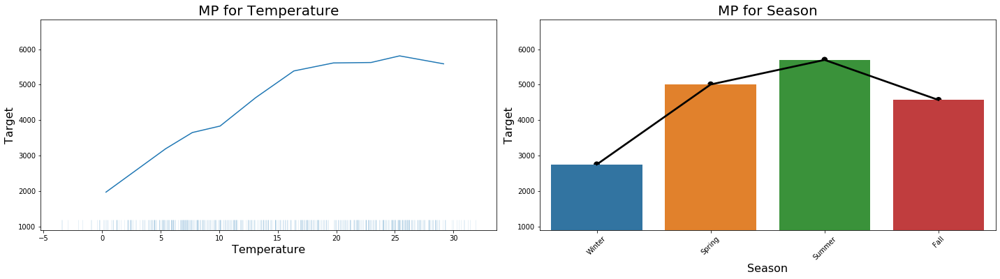

In [24]:
# Obtain the PDPs for variables
features = ['Temperature', 'Season']

# Define the layout of the plot
n_cols = 2
n_rows = len(features) // n_cols + 1

# Obtain PDP for each variable
plt.figure(figsize = (20, 5*n_rows))
for i,var in enumerate(features):
    plt.subplot(n_rows, n_cols, i + 1)
    marginal_plot(data = X_train, 
                            model = rfc, 
                            var_s = var, 
                            var_target = 'Target', 
                            dict_labels = dict_labels,
                            n_grid = 10
                            )
plt.tight_layout()
plt.show()

### Extra: alepython library

2020-06-03 15:54:45,937 : INFO Compute ALE with ALEpython


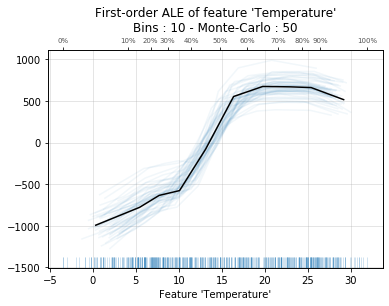

2020-06-03 15:54:46,936 : INFO Compute ALE with ALEpython


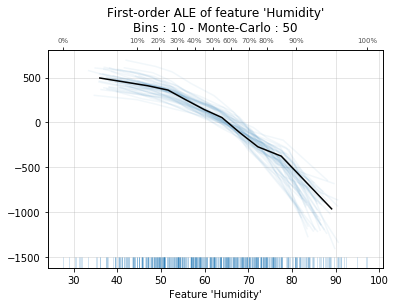

In [25]:
# Numerical variable
logger.info('Compute ALE with ALEpython')
ale_plot(model = rfc, 
         train_set = X_train, 
         features = 'Temperature', 
         bins = 10,
         monte_carlo = True
         )

logger.info('Compute ALE with ALEpython')
ale_plot(model = rfc, 
         train_set = X_train, 
         features = 'Humidity', 
         bins = 10,
         monte_carlo = True
         )

# Categorical variable: NOT IMPLEMENTED YET
# logger.info('Compute ALE with ALEpython')
# ale_plot(model = rfr, 
#          train_set = X_train, 
#          features = 'Season',
#          features_classes = ['Season_Winter','Season_Spring','Season_Summer','Season_Fall']
#          )

2020-06-03 15:54:47,912 : INFO Compute ALE with ALEpython


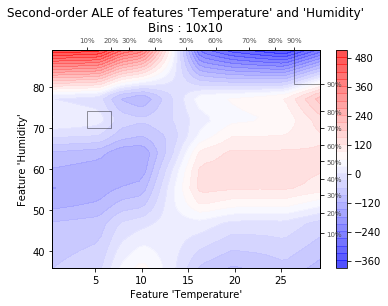

In [26]:
# Numerical variable
logger.info('Compute ALE with ALEpython')
ale_plot(model = rfc, 
         train_set = X_train, 
         features = ['Temperature','Humidity'], 
         bins = 10,
         monte_carlo = True
         )

# Categorical variable: NOT IMPLEMENTED YET
# logger.info('Compute ALE with ALEpython')
# ale_plot(model = rfc, 
#          train_set = X_train, 
#          features = 'Season',
#          features_classes = ['Season_Winter','Season_Spring','Season_Summer','Season_Fall']
#          )

## Permutation Feature Importance

### From scratch

### Extra: sklearn

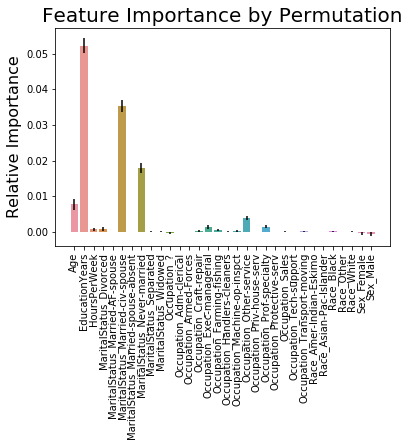

In [42]:
# Compute FPI
pfi = permutation_importance(rfc, 
                             X_test, 
                             y_test,
                             n_repeats = 10,
                             random_state = 0
                             )

# Prepare dataframe 
df_pfi = pd.DataFrame({'Feature'          : X_test.columns, 
                       'importances_mean' : pfi['importances_mean'],
                       'importances_std'  : pfi['importances_std']
                       })

# Make the plot
sns.barplot(x = 'Feature', y = 'importances_mean', data = df_pfi)
plt.errorbar(x = df_pfi['Feature'], 
             y = df_pfi['importances_mean'], 
             yerr = df_pfi['importances_std'],
             color = 'black', 
             linestyle = ''
             )
plt.title('Feature Importance by Permutation', fontsize = 20)
plt.xlabel('')
plt.ylabel('Relative Importance', fontsize = 16)
plt.xticks(rotation = 90)
plt.show()

### Extra: eli5

This library includes a module for computing FPI for sklearn models. This module generates this values using the function *PermutationImportance*, which needs the following arguments:
* *estimator* (object): The base estimator. This can be both a fitted (if prefit is set to True) or a non-fitted estimator.
* *scoring* (string, callable or None, default=None): Scoring function to use for computing feature importances. A string with scoring name (see scikit-learn docs) or a scorer callable object / function with signature scorer(estimator, X, y). If None, the score method of the estimator is used.
* *n_iter* (int, default 5): Number of random shuffle iterations. Decrease to improve speed, increase to get more precise estimates.

In [51]:
# Compute FPI
perm = eli5.sklearn.PermutationImportance(rfc, n_iter = 10, random_state=0)
perm = perm.fit(X_test, y_test)

# Make the plots
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.0527 ± 0.0019,EducationYears
0.0348 ± 0.0032,MaritalStatus_Married-civ-spouse
0.0170 ± 0.0036,MaritalStatus_Never-married
0.0078 ± 0.0020,Age
0.0034 ± 0.0016,Occupation_Other-service
0.0013 ± 0.0010,Occupation_Prof-specialty
0.0013 ± 0.0007,Occupation_Exec-managerial
0.0010 ± 0.0008,MaritalStatus_Divorced
0.0008 ± 0.0016,HoursPerWeek
0.0006 ± 0.0006,Occupation_Craft-repair


## Shapley values

### From scratch

### Extra: shap library

This library includes a modules for computing SHAP for various models: 
* *TreeExplainer*: An implementation of Tree SHAP, a fast and exact algorithm to compute SHAP values for trees and ensembles of trees.
* *DeepExplainer*: An implementation of Deep SHAP, a faster (but only approximate) algorithm to compute SHAP values for deep learning models that is based on connections between SHAP and the DeepLIFT algorithm.
* *GradientExplainer*: An implementation of expected gradients to approximate SHAP values for deep learning models. It is based on connections between SHAP and the Integrated Gradients algorithm. GradientExplainer is slower than DeepExplainer and makes different approximation assumptions.
* *LinearExplainer*: For a linear model with independent features we can analytically compute the exact SHAP values. We can also account for feature correlation if we are willing to estimate the feature covaraince matrix. LinearExplainer supports both of these options.
* *KernelExplainer*: An implementation of Kernel SHAP, a model agnostic method to estimate SHAP values for any model. Because it makes not assumptions about the model type, KernelExplainer is slower than the other model type specific algorithms.

We are using *KernelExplainer* by its model-agnosticness. It has the following arguments:
* *model*: function or iml.Model. User supplied function that takes a matrix of samples (# samples x # features) and computes a the output of the model for those samples. The output can be a vector (# samples) or a matrix (# samples x # model outputs).
* *data*: numpy.array or pandas.DataFrame or shap.common.DenseData or any scipy.sparse matrix The background dataset to use for integrating out features. To determine the impact of a feature, that feature is set to “missing” and the change in the model output is observed. Since most models aren’t designed to handle arbitrary missing data at test time, we simulate “missing” by replacing the feature with the values it takes in the background dataset. So if the background dataset is a simple sample of all zeros, then we would approximate a feature being missing by setting it to zero. For small problems this background dataset can be the whole training set, but for larger problems consider using a single reference value or using the kmeans function to summarize the dataset. Note: for sparse case we accept any sparse matrix but convert to lil format for performance.
* *link*:“identity” or “logit”. A generalized linear model link to connect the feature importance values to the model output. Since the feature importance values, phi, sum up to the model output, it often makes sense to connect them to the output with a link function where link(output) = sum(phi). If the model output is a probability then the LogitLink link function makes the feature importance values have log-odds units.

And we can get many different plots:
* *force_plot()*: plots the Shapley values, the effects of each feature's value on the prediction, for each instance.
* *summary_plot()*: plot the distribution Shapley values for all instances in a violin plot.
* *dependence_plot()*: plot the distribution Shapley values of a feature respect to the value of the feature.
* *waterfall_plot()*: plot the values on force_plot more clear.

In [53]:
# Initialize JS for plots
shap.initjs()

# Create explainer
explainer = shap.KernelExplainer(model = rfc.predict, 
                                 data = np.array(X_train)
                                 )

# Predict for many instances
shap_values = explainer.shap_values(X_test, nsamples = 10)

Using 36631 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


KeyboardInterrupt: 

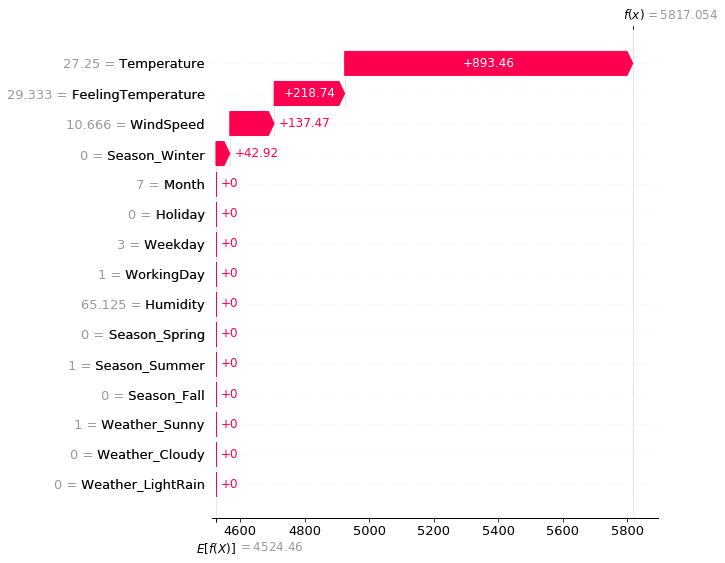

In [114]:
# Predict for single instances
i = 1
shap.waterfall_plot(explainer.expected_value, shap_values[i], X_test.iloc[i,:], max_display = 20)

In [115]:
shap.force_plot(explainer.expected_value, shap_values[i], X_test.iloc[i,:])

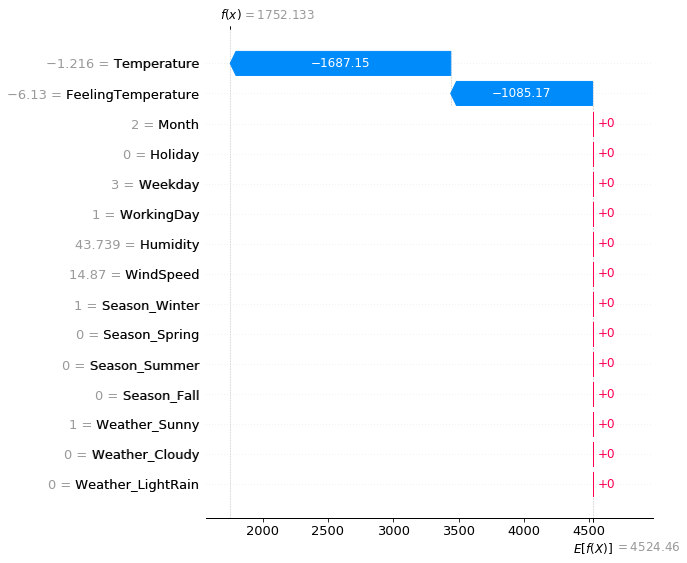

In [116]:
# Predict for single instances
i = 10
shap.waterfall_plot(explainer.expected_value, shap_values[i], X_test.iloc[i,:], max_display = 20)

In [117]:
shap.force_plot(explainer.expected_value, shap_values[i], X_test.iloc[i,:])

In [118]:
# Predict for many instances
shap.force_plot(explainer.expected_value, shap_values[1:10,:], X_test.iloc[1:10,:])

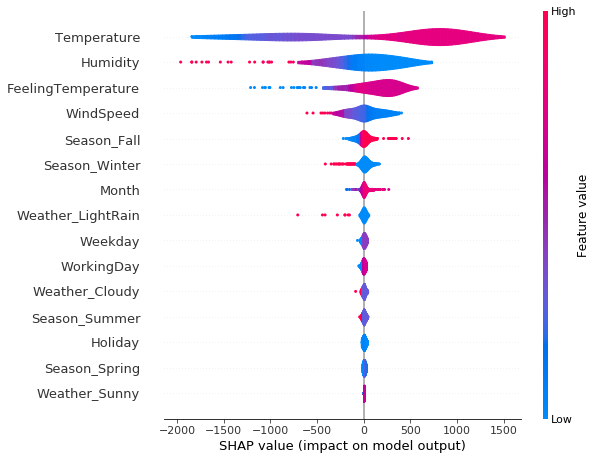

In [119]:
# Get summary plot
shap.summary_plot(shap_values, 
                  X_test, 
                  feature_names = X.columns.tolist(),
                  plot_type="violin"
                  )

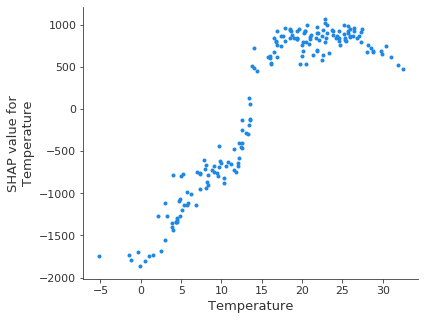

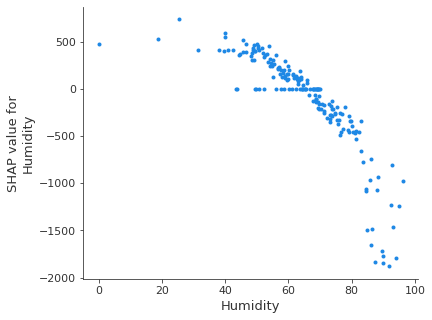

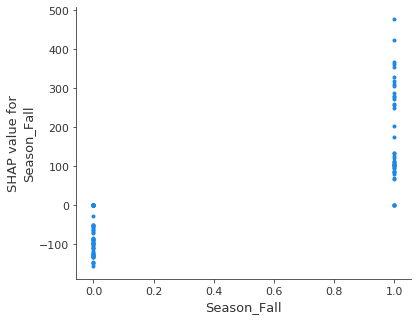

In [97]:
# Get some dependence plots
for i, var in enumerate(['Temperature','Humidity','Season_Fall']):
    shap.dependence_plot(var, shap_values, X_test, feature_names = X_test.columns, interaction_index = None)

## Global Surrogate Models

In [14]:
def surrogate_model_linear(model, X_train, y_train, X_test, y_test):
    # Get predictions from the original model
    y_train = model.predict(X_train)
    y_test  = model.predict(X_test)
    
    # Initiate and train the linear model
    lr = LogisticRegression()
    lr.fit(X_train, y_train)
    
    # Compute weights
    df_weights = pd.DataFrame({'Feature' : X_train.columns, 'Weight' : lr.coef_[0]})

    # Compute effects
    df_effects = np.exp(np.multiply(X, df_weights.iloc[:,1]))

    # Plot weights
    plt.figure(figsize = (10, 5))
    sns.barplot(x = 'Feature', y = 'Weight', data = df_weights)
    plt.title('Weights of Linear Model - (acc={:.2f})'.format(lr.score(X_test, y_test)), fontsize = 20)
    plt.xlabel('')
    plt.ylabel('Weigth', fontsize = 16)
    plt.xticks(rotation = 90)
    plt.show()

    # Plot effects
    plt.figure(figsize = (10, 5))
    sns.boxplot(data = df_effects)
    plt.title('Effects of Linear Model - (acc={:.2f})'.format(lr.score(X_test, y_test)), fontsize = 20)
    plt.xlabel('', fontsize = 16)
    plt.ylabel('Effect', fontsize = 16)
    plt.xticks(rotation = 90)
    plt.show()

In [15]:
def surrogate_model_tree(model, X_train, y_train, X_test, y_test):
    # Get predictions from the original model
    y_train = model.predict(X_train)
    y_test  = model.predict(X_test)
    
    # Initiate and train the model
    dtr = DecisionTreeClassifier(max_depth = 3)
    dtr.fit(X_train, y_train)

    # Compute importances
    df_importances = pd.DataFrame({'Feature' : X.columns, 'Importance' : dtr.feature_importances_})
    df_importances = df_importances.sort_values(by = 'Importance')

    # Plot structure
    plt.figure(figsize = (10, 5))
    plot_tree(dtr)
    plt.title('Structure of Decission Tree - ($R^2$={:.2f})'.format(dtr.score(X_test, y_test)), fontsize = 20)
    plt.show()

    # Plot importances
    plt.figure(figsize = (10, 5))
    sns.barplot(x = 'Feature', y = 'Importance', data = df_importances)
    plt.title('Feature Importances of Decision Tree - ($R^2$={:.2f})'.format(dtr.score(X_test, y_test)), fontsize = 20)
    plt.xlabel('', fontsize = 16)
    plt.ylabel('Relative Importance', fontsize = 16)
    plt.xticks(rotation = 90)
    plt.show()

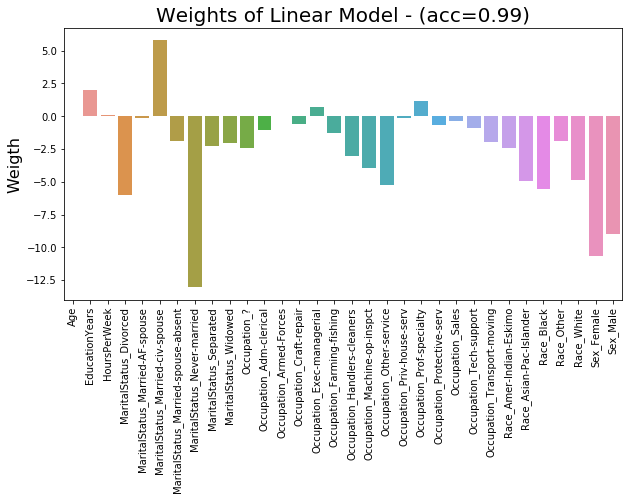

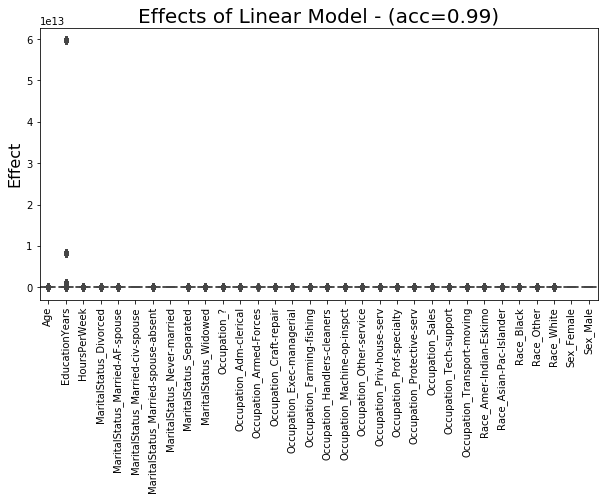

In [16]:
surrogate_model_linear(rfc, X_train, y_train, X_test, y_test)

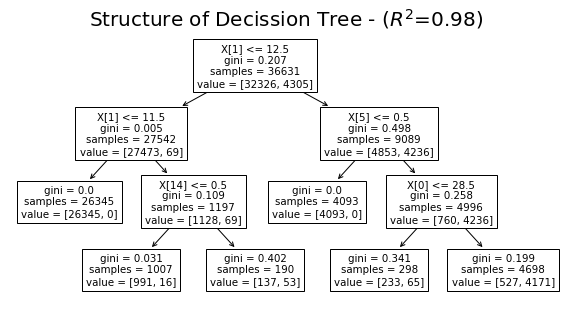

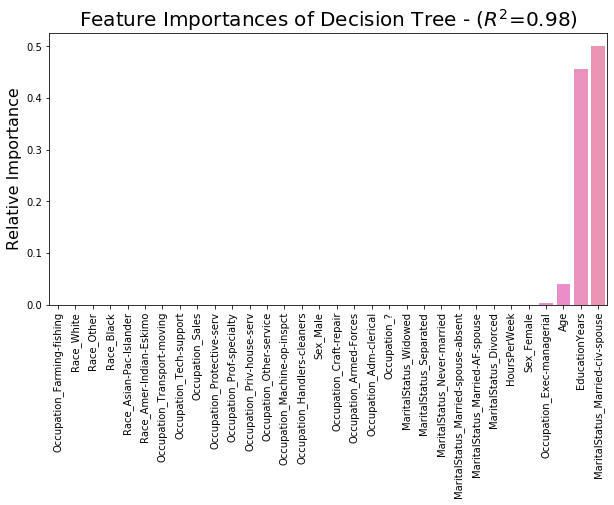

In [17]:
surrogate_model_tree(rfc, X_train, y_train, X_test, y_test)

## LIME

### From scratch

### Extra: lime library

In [15]:
# Get feature names
feature_names = X.columns.tolist()
categorical_features = {i : col for i, col in enumerate(X_train.columns) if ('_' in col)}

# Create explainer
explainer = LimeTabularExplainer(np.array(X_train), 
                                 feature_names = feature_names, 
                                 class_names = ['<=50K','50K<'], 
                                 categorical_features = categorical_features, 
                                 verbose = True, 
                                 mode = 'classification')

# Explain some instance prediction
for i in [0,7]:
    exp = explainer.explain_instance(np.array(X_test)[i], rfc.predict_proba, num_features=5)
    exp.show_in_notebook(show_table = True)

Intercept 0.29061129550928
Prediction_local [0.17138371]
Right: 0.10569763274738549


Intercept 0.08589008488460484
Prediction_local [0.42011301]
Right: 0.5987197574025817


## Anchors

### Library: anchor 

An anchor explanation is a rule that sufficiently "anchors" the prediction locally – such that changes to the rest of the feature values of the instance do not matter. In other words, for instances on which the anchor holds, the prediction is (almost) always the same. The anchor method is able to explain any black box classifier, with two or more classes. All we require is that the classifier implements a function that takes in raw text or a numpy array and outputs a prediction.

We are interested in the tabular implementation of the model:
* **anchor.anchor_tabular.AnchorTabularExplainer**:
    * *class_names*: labels for the classes
    * *feature_names*: labels for the features
    * *train_data*: np.array with the data
    * *categorical_names*: map from integer to list of strings, names for each value of the categorical features. Every feature that is not in this map will be considered as ordinal or continuous, and thus discretized.

In [16]:
# Get feature names
feature_names = X.columns.tolist()
categorical_features = {i : ['0','1'] for i, col in enumerate(X_train.columns) if ('_' in col)}

# Create explainer
explainer = AnchorTabularExplainer(train_data = np.array(X_train),
                                   class_names = ['<=50K','50K<'],
                                   feature_names = feature_names,
                                   categorical_names = categorical_features
                                   )

# Explain some instance prediction
for i in [0,7]:
    exp = explainer.explain_instance(np.array(X_test)[i].reshape(1, -1), rfc.predict, threshold=0.95)
    exp.show_in_notebook()

## Counterfatual explanations

### Library: alibi

The library alibi (an alibi, in spanish *Coartada*, is a form of defense used in criminal procedure wherein the accused attempts to prove that they were in some other place at the time the alleged offense was committed) provides an high-quality implementations of black-box, white-box, local and global explanation methods for classification and regression models.

We are interested in the implemetations regarding counterfactuals:
* **alibi.explainers.CounterFactual**: besides passing the model, we hsve to set a large number of hyperparameters:
    * General:  
        * *shape*: shape of the instance to be explained, starting with batch dimension. Currently only single explanations are supported, so the batch dimension should be equal to 1.
        * *feature_range*: global or feature-wise min and max values for the perturbed instance.
        * *write_dir*: write directory for Tensorboard logging of the loss terms. It can be helpful when tuning the hyperparameters for your use case. It makes it easy to verify that e.g. not 1 loss term dominates the optimization, that the number of iterations is OK etc. You can access Tensorboard by running tensorboard --logdir {write_dir} in the terminal.
        * *debug*: flag to enable/disable writing to Tensorboard.
    * Optimizer:
        * *max_iterations*: number of loss optimization steps for each value of λ; the multiplier of the distance loss term.
        * *learning_rate_init*: initial learning rate, follows linear decay.
        * *decay*: flag to disable learning rate decay if desired
        * *early_stop*: early stopping criterion for the search. If no counterfactuals are found for this many steps or if this many counterfactuals are found in a row we change λ accordingly and continue the search.
        * *init*: how to initialize the search, currently only "identity" is supported meaning the search starts from the original instance.
    * Objective function:
        * *distance_fn*: distance function between the test instance X and the proposed counterfactual X′, currently only "l1" is supported.
        * *target_proba*: desired target probability for the returned counterfactual instance. Defaults to 1.0, but it could be useful to reduce it to allow a looser definition of a counterfactual instance.
        * *tol*: the tolerance within the target_proba, this works in tandem with target_proba to specify a range of acceptable predicted probability values for the counterfactual.
        * *target_class*: desired target class for the returned counterfactual instance. Can be either an integer denoting the specific class membership or the string other which will find a counterfactual instance whose predicted class is anything other than the class of the test instance.
        * *lam_init*: initial value of the hyperparameter λ. This is set to a high value λ=1e−1 and annealed during the search to find good bounds for λ and for most applications should be fine to leave as default.
        * *max_lam_steps*: the number of steps (outer loops) to search for with a different value of λ.

In [17]:
# Create explainer
cf = alibi.explainers.CounterFactual(rfc.predict_proba, (1,X_train.shape[1]), lam_init = 1)
cf.explain(np.array(X_test)[1].reshape(1,-1))

# Explain some instance prediction
for i in [0,7]:
    exp = cf.explain(np.array(X_test)[1].reshape(1,-1))
    print(exp)





Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Instructions for updating:
Deprecated in favor of operator or tf.math.divide.




No appropriate lambda range found, try decreasing lam_init
Traceback (most recent call last):
  File "/home/pablo/anaconda3/lib/python3.7/site-packages/alibi/explainers/counterfactual.py", line 522, in _minimize_loss
    lb_ix = np.where(cf_count > 0)[0][1]  # take the second order of magnitude with some CFs as lower-bound
IndexError: index 1 is out of bounds for axis 0 with size 0


UnboundLocalError: local variable 'lb_ix' referenced before assignment

* **alibi.explainers.CEM**: besides passing the the predictive and auto-encoder models, we set a number of hyperparameters:
    * General:
        * *mode*: ‘PN’ or ‘PP’.
        * *shape*: shape of the instance to be explained, starting with batch dimension. Currently only single explanations are supported, so the batch dimension should be equal to 1.
        * *feature_range*: global or feature-wise min and max values for the perturbed instance.
    * Optimizer:
        * *max_iterations*: number of loss optimization steps for each value of c; the multiplier of the first loss term.
        * *learning_rate_init*: initial learning rate, follows polynomial decay.
        * *clip*: min and max gradient values.
    * Non-informative value:
        * *no_info_val*: as explained in the previous section, it is important to define which feature values are considered background and not crucial for the class predictions. For MNIST images scaled between 0 and 1 or -0.5 and 0.5 as in the notebooks, pixel perturbations in the direction of the (low) background pixel value can be seen as removing features, moving towards the non-informative value. As a result, the no_info_val parameter is set at a low value like -1. no_info_val can be defined globally or feature-wise. For most applications, domain knowledge becomes very important here. If a representative sample of the training set is available, we can always (naively) infer a no_info_val by taking the feature-wise median or mean:
    * Ojective function:
        * *c_init* and *c_steps*: the multiplier c of the first loss term is updated for c_steps iterations, starting at c_init. The first loss term encourages the perturbed instance to be predicted as a different class for a PN and the same class for a PP. If we find a candidate PN or PP for the current value of c, we reduce the value of c for the next optimization cycle to put more emphasis on the regularization terms and improve the solution. If we cannot find a solution, c is increased to put more weight on the prediction class restrictions of the PN and PP before focusing on the regularization.
       * kappa: the first term in the loss function is defined by a difference between the predicted probabilities for the perturbed instance of the original class and the max of the other classes. $\kappa \geq 0$ defines a cap for this difference, limiting its impact on the overall loss to be optimized. Similar to the original paper, we set $\kappa$ to 0. in the examples.
       * beta: $\beta$ is the L1 loss term multiplier. A higher value for $\beta$ means more weight on the sparsity restrictions of the perturbations.
       * gamma: multiplier for the optional L2 reconstruction error. A higher value for $\gamma$ means more emphasis on the reconstruction error penalty defined by the auto-encoder. Similar to the paper, we set $\gamma$ to 100 when we have an auto-encoder available.

In [31]:
# Create explainer
cem = alibi.explainers.CEM(rfc.predict_proba, 
          mode = 'PN', 
          shape = (1,X_train.shape[1]), 
          feature_range = (np.array(X_train).min(axis = 0).reshape((1,X_train.shape[1]))-.1, np.array(X_train).max(axis = 0).reshape((1,X_train.shape[1]))+.1) ,
          max_iterations = 1000,
          learning_rate_init = 1e-2,
          kappa = 0.2, 
          beta = 0.1,
          gamma = 100, 
          c_init = 100.0, 
          c_steps = 10, 
          clip = (-1000.0,1000.0)
          )

exp = cf.explain(np.array(X_test)[1].reshape(1,-1))
print(exp)

No appropriate lambda range found, try decreasing lam_init
Traceback (most recent call last):
  File "/home/pablo/anaconda3/lib/python3.7/site-packages/alibi/explainers/counterfactual.py", line 522, in _minimize_loss
    lb_ix = np.where(cf_count > 0)[0][1]  # take the second order of magnitude with some CFs as lower-bound
IndexError: index 1 is out of bounds for axis 0 with size 0


UnboundLocalError: local variable 'lb_ix' referenced before assignment

* **alibi.explainers.CounterFactualProto**: besides passing the predictive, and (optional) autoencoder and models, we set a number of hyperparameters:
    * General:
        * *shape*: shape of the instance to be explained, starting with batch dimension. Currently only single explanations are supported, so the batch dimension should be equal to 1.
        * *feature_range*: global or feature-wise min and max values for the perturbed instance.
        * *write_dir*: write directory for Tensorboard logging of the loss terms. It can be helpful when tuning the hyperparameters for your use case. It makes it easy to verify that e.g. not 1 loss term dominates the optimization, that the number of iterations is OK etc. You can access Tensorboard by running tensorboard --logdir {write_dir} in the terminal. The figure below for example shows the loss to be optimized over different c iterations. It is clear that within each iteration, the number of max_iterations steps is too high and we can speed up the search.
    * Optimizer:
        * *max_iterations*: number of loss optimization steps for each value of c; the multiplier of the first loss term.
        * *learning_rate_init*: initial learning rate, follows polynomial decay.
        * *clip*: min and max gradient values.
    * Objective function:
        * *c_init* and *c_steps*: the multiplier c of the first loss term is updated for c_steps iterations, starting at c_init. The first loss term encourages the perturbed instance to be predicted as a different class than the original instance. If we find a candidate counterfactual for the current value of c, we reduce the value of c for the next optimization cycle to put more emphasis on the other loss terms and improve the solution. If we cannot find a solution, c is increased to put more weight on the prediction class restrictions of the counterfactual.
        * *kappa*: the first term in the loss function is defined by a difference between the predicted probabilities for the perturbed instance of the original class and the max of the other classes. κ≥0 defines a cap for this difference, limiting its impact on the overall loss to be optimized. Similar to CEM, we set κ to 0 in the examples.
        * *beta*: $\beta$ is the L1 loss term multiplier. A higher value for $\beta$ means more weight on the sparsity restrictions of the perturbations. $\beta$ equal to 0.1 works well for the example datasets.
        * *gamma*: multiplier for the optional L2 reconstruction error. A higher value for $\gamma$ means more emphasis on the reconstruction error penalty defined by the autoencoder. A value of 100 is reasonable for the examples.
        * *theta*: multiplier for the Lproto loss term. A higher θ means more emphasis on the gradients guiding the counterfactual towards the nearest class prototype. A value of 100 worked well for the examples.
        * *cat_vars*: if the categorical variables have ordinal encodings, this is a dictionary with as keys the categorical columns and values the number of categories for the categorical variable in the dataset. If one-hot encoding is applied to the data, then the keys of the cat_vars dictionary represent the column where each categorical variable starts while the values still return the number of categories.
        * *ohe*: a flag (True or False) whether the categories are one-hot encoded.

In [30]:
beta = .01
c_init = 1.
c_steps = 5
max_iterations = 500
rng = (-1., 1.)  # scale features between -1 and 1
rng_shape = (1,) + X_train.shape[1:]
feature_range = (np.array(X_train).min(axis = 0).reshape((1,X_train.shape[1]))-.1, np.array(X_train).max(axis = 0).reshape((1,X_train.shape[1]))+.1) 
    
    
    # Create explainer
cf = alibi.explainers.CounterFactualProto(rfc.predict_proba, (1,X_train.shape[1]), beta=beta,
                         cat_vars=cat_vars_ord,
                         max_iterations=max_iterations,
                         feature_range=feature_range,
                         c_init=c_init,
                         c_steps=c_steps,
                         eps=(.01, .01))
cf.explain(np.array(X_test)[1].reshape(1,-1))

# Explain some instance prediction
for i in [0,7]:
    exp = cf.explain(np.array(X_test)[1].reshape(1,-1))
    print(exp)

NameError: name 'cat_vars_ord' is not defined